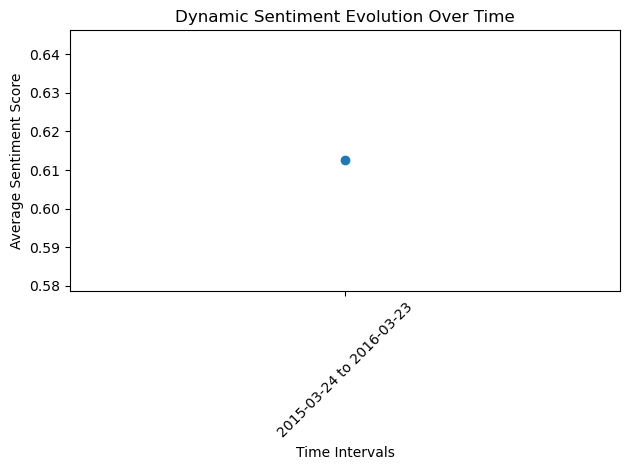

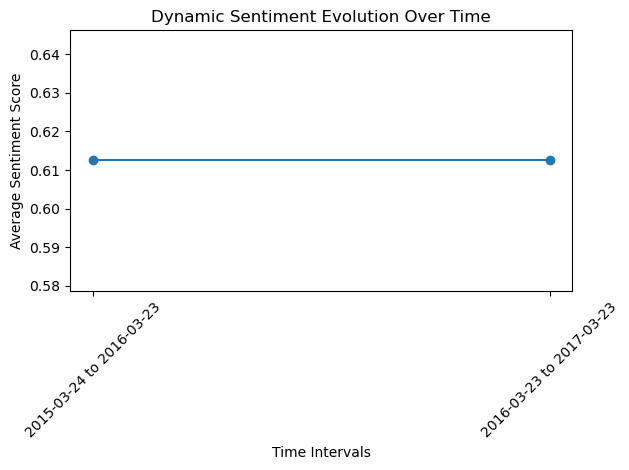

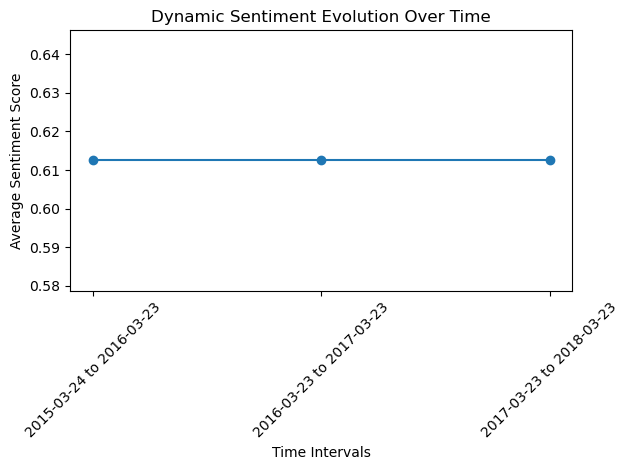

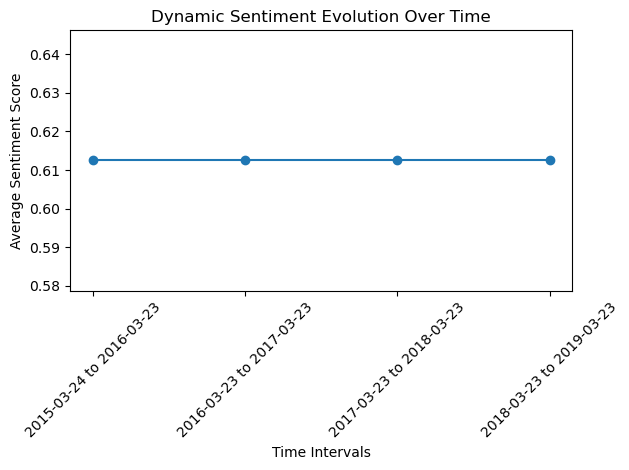

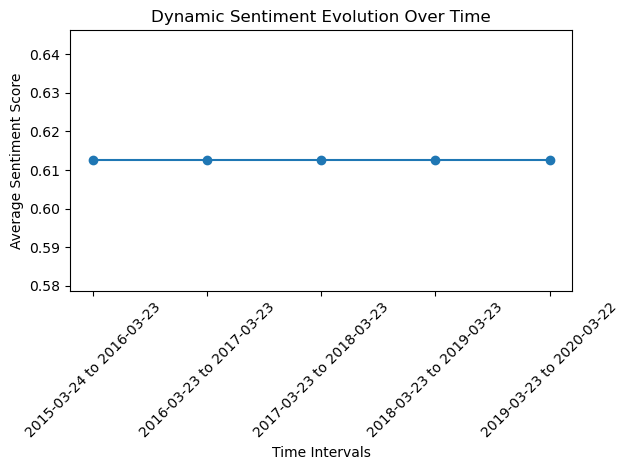

...

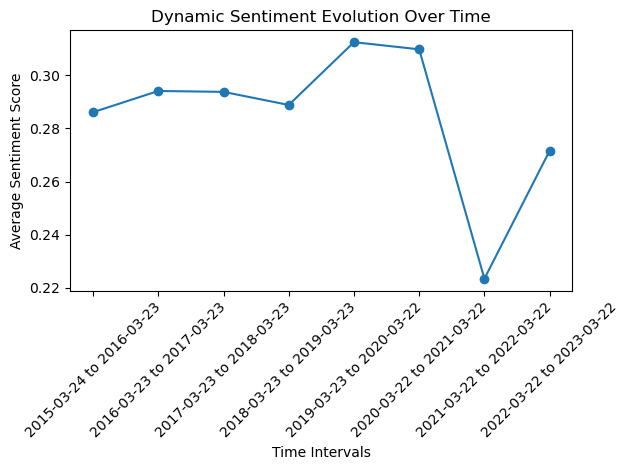

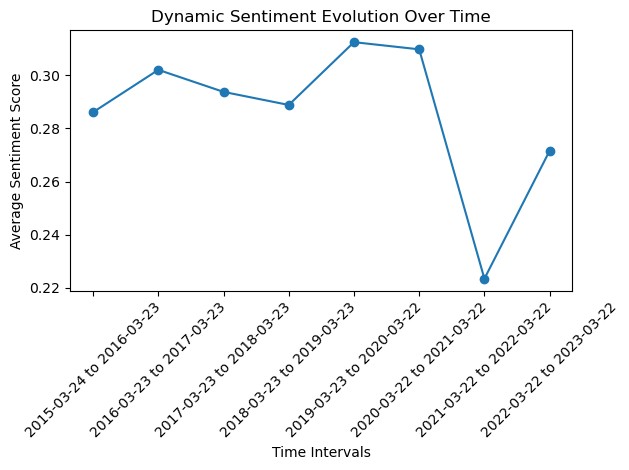

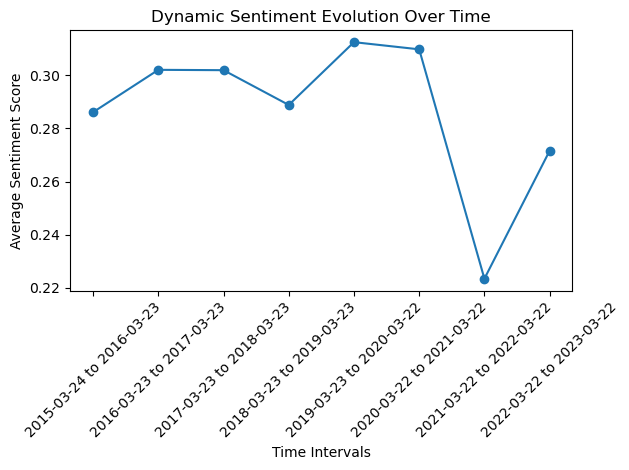

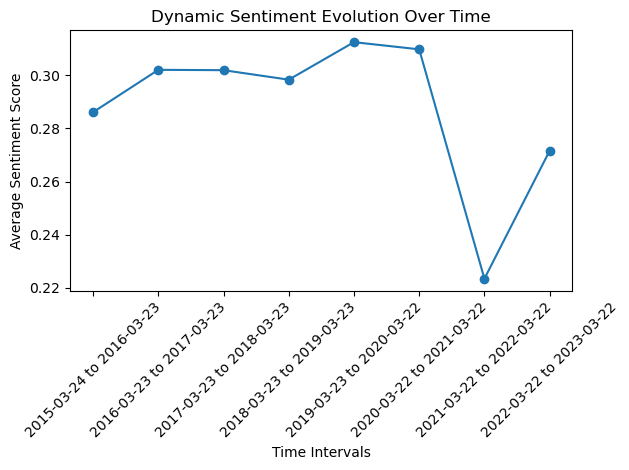

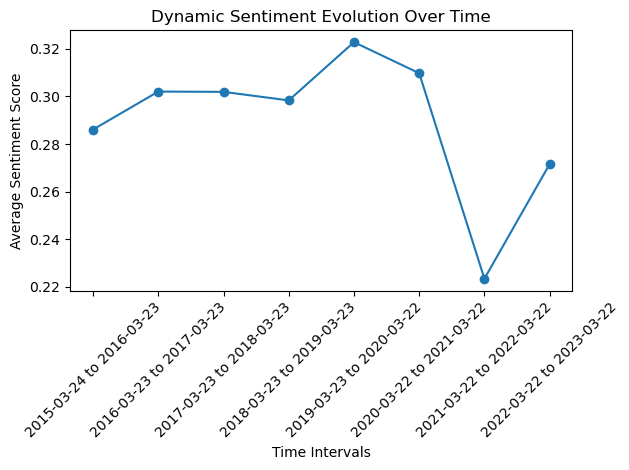

<Figure size 640x480 with 0 Axes>

In [21]:
import requests
import time
import re
import nltk
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from datetime import datetime
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from gensim.models import Word2Vec
from textblob import TextBlob
from datetime import timedelta

# Download NLTK resources. Run only if you can establish connection with nltk and access raw.githubusercontent.com
# nltk.download('punkt')
# nltk.download('stopwords')


# SECTION 1: Data Acquisition: 
# Function to scrape user reviews from IMDb
def scrape_imdb_reviews(movie_url, max_reviews=50):

# Set up the Selenium WebDriver
    driver = webdriver.Chrome()  
    # Make sure to have the appropriate WebDriver installed and in your PATH. In this case its for chrome
    driver.get(movie_url)

    # Wait for the "Load More" button to be present
    wait = WebDriverWait(driver, 10)
    load_more_button = wait.until(EC.presence_of_element_located((By.CLASS_NAME, 'load-more-data')))

    # Click the "Load More" button until a certain number of reviews are loaded
    reviews = []
    while len(reviews) < max_reviews:
        # Scroll to the bottom of the page to load more reviews
        driver.find_element(By.TAG_NAME, 'body').send_keys(Keys.END)
        time.sleep(2)  # Allow time for the new reviews to load

        # Click the "Load More" button
        load_more_button.click()
        time.sleep(2)  # Allow time for the new reviews to load

        # Parse the HTML content of the updated page
        soup = BeautifulSoup(driver.page_source, 'html.parser')

        # Extract individual reviews
        for review_div, date_tag in zip(soup.find_all('div', class_='text show-more__control'),
                                        soup.find_all('span', class_='review-date')):
            review_text = review_div.get_text(strip=True)
            review_date = None
            if date_tag:
                review_date = date_tag.get_text(strip=True)
                # Keep only the date without the time
                review_date = datetime.strptime(review_date, '%d %B %Y').date()

            # Check if the review date is not earlier than 2015
            if review_date and review_date.year >= 2015:
                # Store the review text and date in separate dictionaries
                review_text_info = {'text': review_text}
                review_date_info = {'date': review_date}

                # Append both dictionaries to the reviews list
                reviews.append({'text_info': review_text_info, 'date_info': review_date_info})
                
    # Close the WebDriver
    driver.quit()

    # Return the first max_reviews reviews
    return reviews[:max_reviews]

# Setting the url of IMDB to be scrapped
movie_url = 'https://www.imdb.com/title/tt0068646/reviews'
# calling the scrape_imdb_reviews function
reviews = scrape_imdb_reviews(movie_url, max_reviews=50)



# SECTION 2: Sentiment Analysis Implementation: 
# Function to calculate sentiment score using TextBlob
def calculate_sentiment_score(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity



# SECTION 3: Data Processing and Cleaning: 
# Function to tokenize reviews
def tokenize_reviews(reviews):
    tokenized_reviews = []
    for review in reviews:
        # Tokenize sentences
        sentences = sent_tokenize(review.lower())  # Convert to lowercase for consistency
        # Tokenize words and filter out stopwords and non-alphabetic words
        words = [word for sentence in sentences for word in word_tokenize(sentence) if word.isalpha() and word not in stopwords.words('english')]
        tokenized_reviews.append(words)
    return tokenized_reviews
# print(tokenized_reviews)

# Function to train Word2Vec model
def train_word2vec_model(tokenized_reviews):
    model = Word2Vec(sentences=tokenized_reviews, vector_size=100, window=5, min_count=1, workers=4)
    return model
# print(model)

# Function to convert timestamps into intervals
def convert_to_intervals(reviews, start_date, interval_days):
    intervals = {}
    for review in reviews:
        date = review['date_info']['date']
        interval_start = start_date
        while interval_start < date:
            interval_end = interval_start + timedelta(days=interval_days)
            interval_key = (interval_start, interval_end)
            if interval_key not in intervals:
                intervals[interval_key] = {'reviews': [], 'sentiment_scores': []}
            intervals[interval_key]['reviews'].append(review)
            sentiment_score = calculate_sentiment_score(review['text_info']['text'])
            intervals[interval_key]['sentiment_scores'].append(sentiment_score)
            interval_start = interval_end
            # Update the plot dynamically
            plot_sentiment_curve(intervals)
    return intervals

# Convert date strings to datetime objects
for review in reviews:
    if isinstance(review['date_info']['date'], str):  # Check if it's a string
        review['date_info']['date'] = datetime.strptime(review['date_info']['date'], '%Y-%m-%d')

# Tokenize reviews
tokenized_reviews = tokenize_reviews([review['text_info']['text'] for review in reviews])

# Train Word2Vec model
word2vec_model = train_word2vec_model(tokenized_reviews)

# Convert timestamps into intervals
start_date = min(review['date_info']['date'] for review in reviews)
interval_days = 365
review_intervals = convert_to_intervals(reviews, start_date, interval_days)
    

    
# SECTION 4: Results Visualization: 
# Plotting function
def plot_sentiment_curve(intervals):
    plt.clf()  # Clear the previous plot
    interval_keys = sorted(intervals.keys())
    average_sentiments = [sum(intervals[key]['sentiment_scores']) / len(intervals[key]['sentiment_scores']) for key in interval_keys]

    # Convert datetime objects to string for plotting
    interval_strings = [f"{key[0].strftime('%Y-%m-%d')} to {key[1].strftime('%Y-%m-%d')}" for key in interval_keys]

    plt.plot(interval_strings, average_sentiments, marker='o')
    plt.xticks(rotation=45)
    plt.xlabel('Time Intervals')
    plt.ylabel('Average Sentiment Score')
    plt.title('Dynamic Sentiment Evolution Over Time')
    plt.tight_layout()
    plt.pause(0.1)  # Add a short pause for dynamic updates
    plt.draw()

    
# Final plot
plt.show()

# Write Up


## Overview

The Project above helps to dynamically plot the average sentiment scores of recent reviews of a movie from IMDB in yearly intervals graphically. For easy navigation of the project, the above code has been broken into four parts based on the requirements of the project, viz;

1. Data Acquisition
2. Sentiment Analysis Implementation
3. Data Processing and Cleaning
4. Results Visualization



### Data Acquisition

The data on which we would be performing sentimental analysis are scrapped from IMDB through the URL https://www.imdb.com/title/tt0068646/reviews. The webpage contains the user reviews of the movie titled 'The Godfather'. Both BeautifulSoup and Selenium were used in scrapping and automating processes for scrapping. Under the data acquisition section goes the scrape_imdb_reviews function used to scrap the reviews from IMDB. This function does the following:

i.    takes two parameters: movie_url (the URL of the IMDb page containing user reviews) and max_reviews (the maximum number of       reviews to scrape, default is set to 50).
ii.   initializes a Selenium WebDriver (for Chrome) and navigates to the specified IMDb page. 
iii.  waits for the "Load More" button to be present on the page. 
iv.   enters a loop to keep clicking the "Load More" button until the desired number of reviews (max_reviews) is reached. Inside       the loop, it scrolls to the bottom of the page, waits for new reviews to load, clicks the "Load More" button, and parses         the HTML content of the updated page using BeautifulSoup. 
v.    extracts individual reviews and their corresponding dates from the HTML. 
vi.   checks if the review date is not earlier than 2015 and stores the review text and date in dictionaries. The dictionaries         are appended to the reviews list. The loop continues until the desired number of reviews is reached. 
vii.  Finally, it closes the WebDriver, and the function returns the first max_reviews reviews (i.e. the first 50 reviews in           this case that meet the if condition).

Also in the data acquisition section, you will observe that the script sets the movie_url variable to the IMDb URL of the desired movie. It then calls the scrape_imdb_reviews function with the specified movie_url and max_reviews=50, storing the result in the reviews variable.

###### NOTE
The maximum number of reviews was set to 50 so that we could properly get all desired reviews needed for our graph, i.e. the reviews from 2015 to 2023. However, if you want a lesser sample size (i.e. a lesser number of reviews), maybe to reduce the runtime of the code, you can change the max_reviews variable to a lesser number. In such a case the graph obtained from the plot will not have the plot of the average sentiment scores for the interval of 2022 to 2023 or other intervals depending on how small the sample size is.



### Sentiment Analysis Implementation

The Sentiment Analysis Implementation section contains a simple function (called calculate_sentiment_score) which calculates the sentiment scores of each review using textBlob. This function takes a piece of text as input, uses TextBlob to analyze the sentiment of the text, and returns a numerical sentiment score (polarity) representing the overall sentiment of the text. The text in our case is the review text from the reviews object



### Data Processing and Cleaning

From the Data Processing and Cleaning section of the code, you will observe some data processing functions such as tokenize_reviews and train_word2vec_model. The former tokenizes the reviews gotten from the reviews object while the latter was used to train a word2vec model. Although these functions do not help in performing the sentiment analysis of our reviews, they however are kept as part of our data processing functions. You can get the list of tokenized reviews for each review by uncommenting the following line of code, from the code above. 
print(tokenized_reviews) 

Also, you could get the word2vec model that was trained by uncommenting the line of code, from the above 
print(model)

Another essential function in this section (for data processing) is the convert_to_intervals function. This function takes three parameters:

reviews: a list of review objects. 
start_date: the starting date for the intervals. 
interval_days: the number of days for each interval. In our case, this has been set to 365 (a year)

The function does the following; 
i.     initializes an empty dictionary called intervals. 
ii.    For each review, it extracts its date and tries to fit it into intervals based on the interval days. 
iii.   For each interval, it appends the review to the corresponding interval and calculates a sentiment score for the review          using the calculate_sentiment_score function. 
iv.    While doing so, it updates a plot dynamically using the function plot_sentiment_curve (which will be discussed in the            nextsection). 
v.     Finally, it returns the intervals dictionary containing reviews and sentiment scores organized by intervals.

Just before calling the convert_to_intervals function, the code block that was pre-commented "Convert date strings to datetime objects" converts date strings in each review dictionary to Python datetime objects. It uses the datetime.strptime method to convert the date strings from the format '%Y-%m-%d'. Finally, the code block pre-commented as "Convert Timestamps into Intervals" sets the start_date as the earliest date from the reviews. The interval duration is set to 365 days (1 year). Then, it calls the convert_to_intervals function to organize the reviews into intervals based on the given start date and interval days.

Also, NOTE that you may also change the interval days as you wish, say 730 days (2 years)



### Results Visualization

Finally, we have the plot_sentiment_curve function which is used to plot the desired graph. Under this function we have;

i.    plt.clf(): This clears the previous plot, ensuring that each time the function is called, it starts with a clean canvas. 
ii.   interval_keys = sorted(intervals.keys()): It retrieves the keys from the intervals dictionary and sorts them. These keys         represent time intervals. 
iii.  average_sentiments = [...]: It calculates the average sentiment score for each time interval. The sentiment scores are           assumed to be stored in the intervals dictionary under each time interval key. 
iv.   interval_strings = [...]: It converts the datetime objects corresponding to the time intervals into formatted strings.           These strings will be used as labels on the x-axis of the plot. 
v.    plt.plot(...): It creates a line plot using the time interval strings on the x-axis and the average sentiment scores on         the y-axis. Each point on the plot is marked with a circle marker ('o'). 
vi.   plt.xticks(rotation=45): It rotates the x-axis labels for better readability. 
vii.  plt.xlabel(...): It sets the label for the x-axis. 
viii. plt.ylabel(...): It sets the label for the y-axis. 
ix.   plt.title(...): It sets the title of the plot. 
x.    plt.tight_layout(): It adjusts the layout of the plot to prevent clipping of labels. 
xi.   plt.pause(0.1): This adds a short pause of 0.1 seconds. This is useful when the function is called in a loop or for             dynamic updates, allowing time for the plot to be displayed before the next iteration. 
xii.  plt.draw(): This updates the plot display.

Moreover, this function is made to visualize how the average sentiment score changes over different time intervals, providing a dynamic representation of sentiment evolution over time.



#### Further Considerations

There would be two folders that would be needed for the code. These folders are to be downloaded by nltk from raw.githubusercontent.com. You can download these folders by uncommenting the following lines of code from the code above

nltk.download('punkt') nltk.download('stopwords')

If however for any reason these folders could not be automatically downloaded, then you will need to download them manually. The folders are added to the files in my GitHub repository. If you are using Windows you would need to add the folders in their respective path;

-> punkt folder: C:\Users\yourpcusername\AppData\Roaming\ -> nltk_data -> tokenizers -> punkt 
-> stopwords folder: C:\Users\yourpcusername\AppData\Roaming\ -> nltk_data -> corpora -> stopwords

NOTE that the former is not a zip folder while the latter is a zip folder.